#**The data consists of runner results from the Boston Marathon between the years of 2001 though 2014. The questions are:**

Can racing results be used to identify which gender the athlete is?

Can racing results be used to identify which age group the athlete is in? 18-25, 25-39, or 40+?

#**Then, if we include the full feature set, that is the times for milestones during the run, of years 2013-2014:**

Can racing results be used to identify which gender the athlete is?

Can racing results be used to identify which age group the athlete is in? 18-25, 25-39, or 40+?


#**Build environment, Load Data, EDA, and Feature Engineering**

Here I load the packages I will need in my data exploration of tha data set. Before I can do that however, the datasets are divided between 14 CSVs, and two of those are formatted differently from the rest. 

After identifying the features that are common across all of the datasets, I make sure to clean the data and merge them all into one, keeping only the columns that exist across all of them. This unfortunately leads to a loss of many columns of data in the two CSVs that were formatted differently, but we'll get to those later.

After some thorough EDA is completed on the merged dataset, I discover a serious problem. There are many records of nonrunners in the data for the years 2013 and 2014, and unfortunately, no simple identifier for any of them. 

After some careful thought, I opted to remove any persons with a finsihing time faster than the actual reported winners from both genders, at least by doing so we rule our any outliars should our results be impacted by completion time.

An additional issue also arises, as the columns of data for finsihing placement in the marathons, whether they be for their gender, their division, or overall, will need some thorough engineering as well before they can be of some use.

After all the cleaning and feature engineering si complete, I am now ready to begin building my models.

In [1]:
import pandas as pd
import numpy as np
import scipy
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.cluster import DBSCAN

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import umap

from sklearn.cluster import MiniBatchKMeans
from sklearn import datasets, metrics
from sklearn.metrics import silhouette_score

from sklearn.model_selection import train_test_split
import time

In [2]:
! git clone https://github.com/llimllib/bostonmarathon.git

Cloning into 'bostonmarathon'...
remote: Enumerating objects: 339, done.
remote: Total 339 (delta 0), reused 0 (delta 0), pack-reused 339
Receiving objects: 100% (339/339), 55.57 MiB | 10.45 MiB/s, done.
Resolving deltas: 100% (138/138), done.


In [3]:
cd bostonmarathon/results/

/content/bostonmarathon/results


In [4]:
r2001 = pd.read_csv("2001/results.csv")
r2002 = pd.read_csv("2002/results.csv")
r2003 = pd.read_csv("2003/results.csv")
r2004 = pd.read_csv("2004/results.csv")
r2005 = pd.read_csv("2005/results.csv")
r2006 = pd.read_csv("2006/results.csv")
r2007 = pd.read_csv("2007/results.csv")
r2008 = pd.read_csv("2008/results.csv")
r2009 = pd.read_csv("2009/results.csv")
r2010 = pd.read_csv("2010/results.csv")
r2011 = pd.read_csv("2011/results.csv")
r2012 = pd.read_csv("2012/results.csv")
r2013 = pd.read_csv("2013/results.csv")
r2014 = pd.read_csv("2014/results.csv")

In [5]:
r2001.insert(0, 'year', 2001, True)
r2002.insert(0, 'year', 2002, True)
r2003.insert(0, 'year', 2003, True)
r2004.insert(0, 'year', 2004, True)
r2005.insert(0, 'year', 2005, True)
r2006.insert(0, 'year', 2006, True)
r2007.insert(0, 'year', 2007, True)
r2008.insert(0, 'year', 2008, True)
r2009.insert(0, 'year', 2009, True)
r2010.insert(0, 'year', 2010, True)
r2011.insert(0, 'year', 2011, True)
r2012.insert(0, 'year', 2012, True)
r2013.insert(0, 'year', 2013, True)
r2014.insert(0, 'year', 2014, True)

In [6]:
runnersmerged01 = pd.concat([r2001, r2002, r2003, r2004, r2005, r2006, r2007, r2008, r2009, r2010, r2011, r2012])

In [7]:
r2013.drop(r2013[r2013['official'] < 130].index, inplace=True)
r2014.drop(r2014[r2014['official'] < 128].index, inplace=True)

r2013.sort_index(axis=1, inplace=True)
r2014.sort_index(axis=1, inplace=True)

runnersmerged02 = pd.concat([r2013, r2014])
runnersmerged02.drop(['name','ctz','bib', 'state', 'city'], inplace=True, axis=1)


runnersmerged02.rename(columns={'overall':'OverallFinish', 'genderdiv':'GenderFinish', 'division':'DivisionFinish'},inplace=True)
runnersmerged02_ = runnersmerged02[['10k', '20k', '25k', '30k', '35k', '40k', '5k', 'pace', 'half']]
runnersmerged02.drop(['10k', '20k', '25k', '30k', '35k', '40k', '5k', 'pace', 'half'], inplace=True, axis=1)

In [8]:
runnersmerged01.sort_index(axis=1, inplace=True)
runnersmerged01.drop(['name','net', 'bib', 'state', 'city'], inplace=True, axis=1)

In [9]:
new0 = runnersmerged01['genderdiv'].str.split('/', n=1, expand=True)
runnersmerged01["GenderFinish"]= new0[0]
runnersmerged01["GenderGroup"]= new0[1]
runnersmerged01.drop(columns=['genderdiv'], inplace=True)
runnersmerged01['GenderGroup'] = pd.to_numeric(runnersmerged01['GenderGroup'],errors='coerce')
runnersmerged01['GenderFinish'] = pd.to_numeric(runnersmerged01['GenderFinish'],errors='coerce')

new1 = runnersmerged01['overall'].str.split('/', n=1, expand=True)
runnersmerged01["OverallFinish"]= new1[0]
runnersmerged01["OverallTotal"]= new1[1]
runnersmerged01.drop(columns=['overall'], inplace=True)
runnersmerged01['OverallFinish'] = pd.to_numeric(runnersmerged01['OverallFinish'],errors='coerce')
runnersmerged01['OverallTotal'] = pd.to_numeric(runnersmerged01['OverallTotal'],errors='coerce')


new2 = runnersmerged01['division'].str.split('/', n=1, expand=True)
runnersmerged01["DivisionFinish"]= new2[0]
runnersmerged01["DivisionTotal"]= new2[1]
runnersmerged01.drop(columns=['division'], inplace=True)
runnersmerged01['DivisionFinish'] = pd.to_numeric(runnersmerged01['DivisionFinish'],errors='coerce')
runnersmerged01['DivisionTotal'] = pd.to_numeric(runnersmerged01['DivisionTotal'],errors='coerce')

runnersmerged01['official'] = pd.to_numeric(runnersmerged01['official'],errors='coerce')

runnersmerged01.drop(runnersmerged01[runnersmerged01['GenderGroup'] < 4800].index, inplace=True)
runnersmerged01.drop(runnersmerged01[runnersmerged01['OverallTotal'] < 13000].index, inplace=True)

runnersmerged01['GenderPercentile'] = runnersmerged01['GenderFinish'] / runnersmerged01['GenderGroup']
runnersmerged01['OverallPercentile'] = runnersmerged01['OverallFinish'] / runnersmerged01['OverallTotal']
runnersmerged01['GenderPercentile'] = runnersmerged01['GenderFinish'] / runnersmerged01['GenderGroup']
runnersmerged01['DivisionPercentile'] = runnersmerged01['DivisionFinish'] / runnersmerged01['DivisionTotal']

In [10]:
new2013 = runnersmerged02[runnersmerged02['year'] == 2013]
new2013['OverallTotal'] = 17600
new2013['GenderGroup'] = [6950 if sex == 'F' else 10648 for sex in new2013['gender']]

new2014 = runnersmerged02[runnersmerged02['year'] == 2014]
new2014['OverallTotal'] = 31930
new2014['GenderGroup'] = [14356 if sex == 'F' else 17575 for sex in new2014['gender']]


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

In [11]:
runnersmerged02 = pd.concat([new2013, new2014])

In [12]:
runnersmerged02.drop(['DivisionFinish'], inplace=True, axis=1)
runnersmerged01.drop(['DivisionFinish', 'DivisionTotal', 'DivisionPercentile'], inplace=True, axis=1)

In [13]:
runnersmerged02['GenderGroup'] = pd.to_numeric(runnersmerged02['GenderGroup'],errors='coerce')
runnersmerged02['GenderFinish'] = pd.to_numeric(runnersmerged02['GenderFinish'],errors='coerce')

runnersmerged02['OverallFinish'] = pd.to_numeric(runnersmerged02['OverallFinish'],errors='coerce')
runnersmerged02['OverallTotal'] = pd.to_numeric(runnersmerged02['OverallTotal'],errors='coerce')

runnersmerged02.drop(runnersmerged02[runnersmerged02['GenderGroup'] < 6800].index, inplace=True)
runnersmerged02.drop(runnersmerged02[runnersmerged02['OverallTotal'] < 10600].index, inplace=True)

runnersmerged02['official'] = pd.to_numeric(runnersmerged02['official'],errors='coerce')
runnersmerged02['GenderPercentile'] = runnersmerged02['GenderFinish'] / runnersmerged02['GenderGroup'] * 100
runnersmerged02['OverallPercentile'] = runnersmerged02['OverallFinish'] / runnersmerged02['OverallTotal'] * 100
runnersmerged02['GenderPercentile'] = runnersmerged02['GenderFinish'] / runnersmerged02['GenderGroup'] * 100

In [14]:
runners2011thru2014 = pd.concat([runnersmerged01, runnersmerged02])

runners2011thru2014.dropna(inplace=True)

runners2011thru2014 = pd.concat([runners2011thru2014, pd.get_dummies(runners2011thru2014['gender'],
                                                                     drop_first=True, prefix='gender')], axis =1)

runners2011thru2014.loc[(runners2011thru2014['age'] <=25), 'AgeGroup'] = 0
runners2011thru2014.loc[(runners2011thru2014['age'] > 25) & (runners2011thru2014['age'] <=40), 'AgeGroup'] = 1
runners2011thru2014.loc[(runners2011thru2014['age'] > 40), 'AgeGroup'] = 2

runners2011thru2014.drop(['age'], axis=1, inplace=True)
runners2011thru2014.drop(['gender'], axis=1, inplace=True)

runners2011thru2014['AgeGroup'] = runners2011thru2014['AgeGroup'].astype(int)
runners2011thru2014['OverallPercentile'] = runners2011thru2014['OverallPercentile'].astype(int)
runners2011thru2014['GenderPercentile'] = runners2011thru2014['GenderPercentile'].astype(int)

runners2011thru2014['official'] = runners2011thru2014['official'].astype(int)

#**Best performing model with target Gender w/ Kmeans**

The best performing model for K-Means with a target variable of Gender belonged to the model using a PCA reductionality of n_components=2. The K clusters were also set to 2, which resulted in a Silhoette score of 70.9%. This indicates a very high chance the data points are close to their nearest centroid. This model performed well, with the original feature set only consisting of three.

In [ ]:
X = runners2011thru2014[['OverallPercentile','GenderPercentile', 'official']].values
Y = runners2011thru2014['gender_M'].values
scaler = StandardScaler()
X_std = scaler.fit_transform(X)

pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_std)

y_pred = KMeans(n_clusters=2).fit_predict(X_pca)

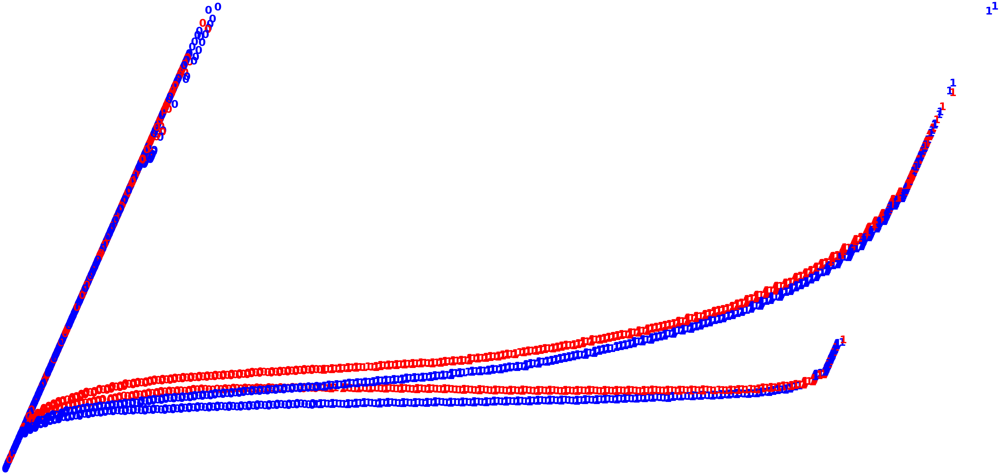

Silhouette score for two cluster k-means: 0.7099971751657029


In [ ]:
plt.figure(figsize=(10,5))
colours = 'rbg'
for i in range(X_pca.shape[0]):
    plt.text(X_pca[i, 0], X_pca[i, 1], str(y_pred[i]),
             color=colours[Y[i]],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

print("Silhouette score for two cluster k-means: {}".format(
    metrics.silhouette_score(X_pca, y_pred, metric='euclidean')))

#**Best performing model with target Gender w/ DBSCAN**

The best performing model for DBSCAN with a target variable of Gender belonged to the model using a PCA/t-SNE reductionality of n_components=2, which resulted in a Silhoette score of 90.7%. This indicates an even higher chance the data points are close to their nearest centroid. This model performed well, with the original feature set only consisting of three. 

The running time of this model is 20+ minutes

In [ ]:
X = runners2011thru2014[['OverallPercentile','GenderPercentile', 'official']].values
Y = runners2011thru2014['gender_M'].values
scaler = StandardScaler()
X_std = scaler.fit_transform(X)

pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_std)


In [ ]:
time_start = time.time()

tsne = TSNE(n_components=2, perplexity=50, n_iter=250)
X_tsne = tsne.fit_transform(X_pca)

print('Time elapsed: {} seconds'.format(time.time()-time_start)) 

Time elapsed: 1279.0123708248138 seconds


In [ ]:
clusters = DBSCAN(eps=.1, min_samples=30).fit_predict(X_tsne)

In [ ]:
print("With Epsilon of .1, the silhouette score of the DBSCAN solution: {}"
.format(metrics.silhouette_score(X_tsne, clusters, metric='euclidean')))

With Epsilon of .1, the silhouette score of the DBSCAN solution: 0.9071358442306519


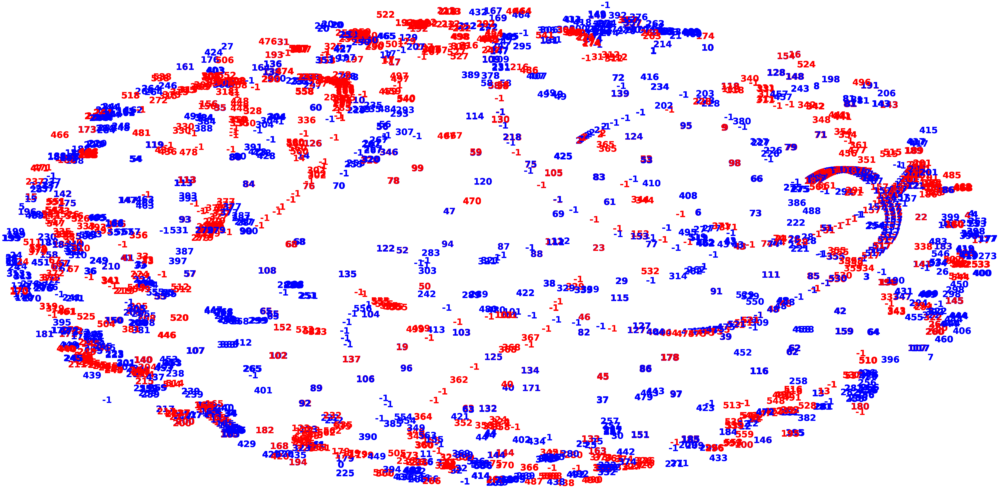

In [ ]:
plt.figure(figsize=(10,5))
colours = 'rbg'
for i in range(X_tsne.shape[0]):
    plt.text(X_tsne[i, 0], X_tsne[i, 1], str(clusters[i]),
             color=colours[Y[i]],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.title('Gender w/ DBSCAN')
plt.show()

#**Best performing model with target AgeGroups w/ Kmeans**

The best performing model for K-Means with a target variable of AgeGroup belonged to the model using a PCA reductionality of n_components=2. The K clusters were also set to 2, which resulted in a Silhoette score of 70.9%. This indicates a very high chance the data points are close to their nearest centroid. This model performed well, with the original feature set only consisting of three. Oddly enough, this model provided the exact same result as the model with gender as the target.

In [15]:
X = runners2011thru2014[['OverallPercentile','GenderPercentile', 'official']].values
Y = runners2011thru2014['AgeGroup'].values
scaler = StandardScaler()
X_std = scaler.fit_transform(X)

pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_std)

y_pred = KMeans(n_clusters=2, random_state=123).fit_predict(X_pca)

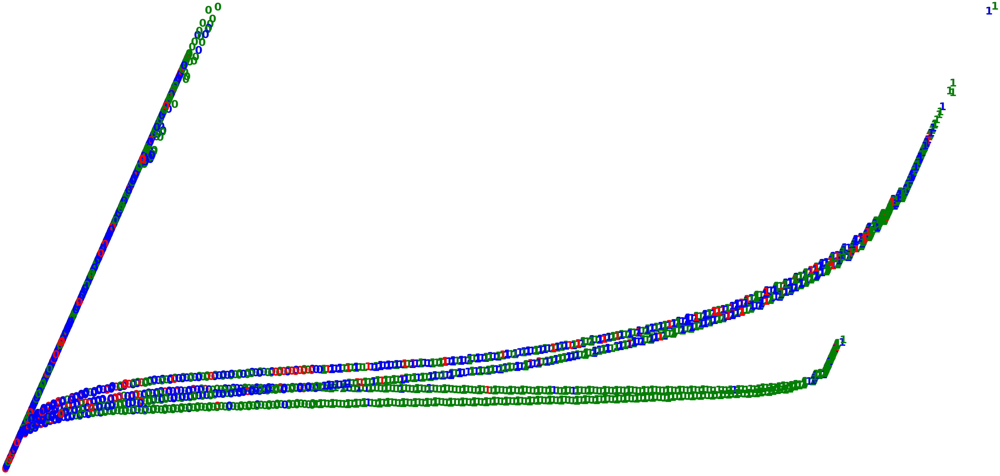

Silhouette score for two cluster k-means: 0.7099971751660797


In [16]:
plt.figure(figsize=(10,5))
colours = 'rbg'
for i in range(X_pca.shape[0]):
    plt.text(X_pca[i, 0], X_pca[i, 1], str(y_pred[i]),
             color=colours[Y[i]],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

print("Silhouette score for two cluster k-means: {}".format(
    metrics.silhouette_score(X_pca, y_pred, metric='euclidean')))

#**Best performing model with target AgeGroups w/ DBSCAN**

The best performing model for DBSCAN with a target variable of AgeGroup belonged to the model using a PCA/t-SNE reductionality of n_components=2, which resulted in a Silhoette score of 92.6%. This indicates an even higher chance the data points are close to their nearest centroid. This model performed well, with the original feature set only consisting of three. Visually this model is difficult to read, so not mugy insight can be gathered here.

The running time of this model is 20+ minutes

In [ ]:
X = runners2011thru2014[['OverallPercentile','GenderPercentile', 'official']].values
Y = runners2011thru2014['AgeGroup'].values
scaler = StandardScaler()
X_std = scaler.fit_transform(X)

pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_std)

tsne = TSNE(n_components=2, perplexity=50, n_iter=250)
X_tsne = tsne.fit_transform(X_pca)

clusters = DBSCAN(eps=.1, min_samples=15).fit_predict(X_tsne)

In [ ]:
print("With Epsilon of .1, the silhouette score of the DBSCAN solution: {}"
.format(metrics.silhouette_score(X_tsne, clusters, metric='euclidean')))

With Epsilon of .1, the silhouette score of the DBSCAN solution: 0.9262532591819763


In [ ]:
plt.figure(figsize=(10,5))
colours = 'rbg'
for i in range(X_tsne.shape[0]):
    plt.text(X_tsne[i, 0], X_tsne[i, 1], str(clusters[i]),
             color=colours[Y[i]],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.title('Gender w/ DBSCAN')
plt.show()

Output hidden; open in https://colab.research.google.com to view.

#**Now what if we only looked at years 2013 and 2014?**

Here we address the question of having more data, will it lead to more accurate results?

The reason we have more data for those years is due to documentation from our data set. The marathon metrics were only measured based on completion time up until 2013, then timestamps for every milestone of a run were also measured, such as at 5k or halfway.

*Please note these are NOT the best models, only the models using the same parameters as the ones above. This is due to time constraints, which in itself  is a lesson learned from running t-SNE on a data set this large.*

In [ ]:
r2013.drop(r2013[r2013['official'] < 130].index, inplace=True)
r2014.drop(r2014[r2014['official'] < 128].index, inplace=True)

r2013.sort_index(axis=1, inplace=True)
r2014.sort_index(axis=1, inplace=True)

runnersmerged02 = pd.concat([r2013, r2014])
runnersmerged02.drop(['name','ctz','bib', 'state', 'city', 'country'], inplace=True, axis=1)
runnersmerged02.rename(columns={'overall':'OverallFinish', 'genderdiv':'GenderFinish', 'division':'DivisionFinish'},inplace=True)

In [ ]:
runnersmerged02.dropna(inplace=True)

In [ ]:
runnersmerged02.drop(runnersmerged02[runnersmerged02['10k'] == '-'].index, inplace=True)
runnersmerged02.drop(runnersmerged02[runnersmerged02['20k'] == '-'].index, inplace=True)
runnersmerged02.drop(runnersmerged02[runnersmerged02['25k'] == '-'].index, inplace=True)
runnersmerged02.drop(runnersmerged02[runnersmerged02['30k'] == '-'].index, inplace=True)
runnersmerged02.drop(runnersmerged02[runnersmerged02['35k'] == '-'].index, inplace=True)
runnersmerged02.drop(runnersmerged02[runnersmerged02['40k'] == '-'].index, inplace=True)
runnersmerged02.drop(runnersmerged02[runnersmerged02['5k'] == '-'].index, inplace=True)
runnersmerged02.drop(runnersmerged02[runnersmerged02['half'] == '-'].index, inplace=True)

In [ ]:
runnersmerged02['5k'] = runnersmerged02['5k'].astype(float)
runnersmerged02['10k'] = runnersmerged02['10k'].astype(float)
runnersmerged02['20k'] = runnersmerged02['20k'].astype(float)
runnersmerged02['25k'] = runnersmerged02['25k'].astype(float)
runnersmerged02['30k'] = runnersmerged02['30k'].astype(float)
runnersmerged02['35k'] = runnersmerged02['35k'].astype(float)
runnersmerged02['40k'] = runnersmerged02['40k'].astype(float)
runnersmerged02['half'] = runnersmerged02['half'].astype(float)

In [ ]:
new2013 = runnersmerged02[runnersmerged02['year'] == 2013]
new2013['OverallTotal'] = 17600
new2013['GenderGroup'] = [6950 if sex == 'F' else 10648 for sex in new2013['gender']]

new2014 = runnersmerged02[runnersmerged02['year'] == 2014]
new2014['OverallTotal'] = 31930
new2014['GenderGroup'] = [14356 if sex == 'F' else 17575 for sex in new2014['gender']]

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

In [ ]:
runnersmerged02 = pd.concat([new2013, new2014])

In [ ]:
runnersmerged02['GenderGroup'] = pd.to_numeric(runnersmerged02['GenderGroup'],errors='coerce')
runnersmerged02['GenderFinish'] = pd.to_numeric(runnersmerged02['GenderFinish'],errors='coerce')


runnersmerged02['OverallFinish'] = pd.to_numeric(runnersmerged02['OverallFinish'],errors='coerce')
runnersmerged02['OverallTotal'] = pd.to_numeric(runnersmerged02['OverallTotal'],errors='coerce')

runnersmerged02.drop(runnersmerged02[runnersmerged02['GenderGroup'] < 6800].index, inplace=True)
runnersmerged02.drop(runnersmerged02[runnersmerged02['OverallTotal'] < 10600].index, inplace=True)

runnersmerged02['official'] = pd.to_numeric(runnersmerged02['official'],errors='coerce')
runnersmerged02['GenderPercentile'] = runnersmerged02['GenderFinish'] / runnersmerged02['GenderGroup'] * 100
runnersmerged02['OverallPercentile'] = runnersmerged02['OverallFinish'] / runnersmerged02['OverallTotal'] * 100
runnersmerged02['GenderPercentile'] = runnersmerged02['GenderFinish'] / runnersmerged02['GenderGroup'] * 100

In [ ]:
new2013 = runnersmerged02[runnersmerged02['year'] == 2013]
new2013['OverallTotal'] = 17600
new2013['GenderGroup'] = [6950 if sex == 'F' else 10648 for sex in new2013['gender']]

new2014 = runnersmerged02[runnersmerged02['year'] == 2014]
new2014['OverallTotal'] = 31930
new2014['GenderGroup'] = [14356 if sex == 'F' else 17575 for sex in new2014['gender']]

runnersmerged02 = pd.concat([new2013, new2014])

runnersmerged02.drop(['DivisionFinish'], inplace=True, axis=1)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

In [ ]:
runnersmerged02.loc[(runnersmerged02['age'] <=25), 'AgeGroup'] = 0
runnersmerged02.loc[(runnersmerged02['age'] > 25) & (runnersmerged02['age'] <=40), 'AgeGroup'] = 1
runnersmerged02.loc[(runnersmerged02['age'] > 40), 'AgeGroup'] = 2

runnersmerged02 = pd.concat([runnersmerged02, pd.get_dummies(runnersmerged02['gender'],
                                                                     drop_first=True, prefix='gender')], axis =1)

runnersmerged02.drop(['age'], axis=1, inplace=True)
runnersmerged02.drop(['gender'], axis=1, inplace=True)

In [ ]:
runnersmerged02.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 47453 entries, 1 to 31983
Data columns (total 19 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   10k                47453 non-null  float64
 1   20k                47453 non-null  float64
 2   25k                47453 non-null  float64
 3   30k                47453 non-null  float64
 4   35k                47453 non-null  float64
 5   40k                47453 non-null  float64
 6   5k                 47453 non-null  float64
 7   GenderFinish       47453 non-null  int64  
 8   half               47453 non-null  float64
 9   official           47453 non-null  float64
 10  OverallFinish      47453 non-null  int64  
 11  pace               47453 non-null  float64
 12  year               47453 non-null  int64  
 13  OverallTotal       47453 non-null  int64  
 14  GenderGroup        47453 non-null  int64  
 15  GenderPercentile   47453 non-null  float64
 16  OverallPercentile  474

#**Target variable Gender using Kmeans w/ PCA**

The results show a Silhoette score of 54.4%. This indicates a moderate chance the data points are close to their nearest centroid. This model performed well, but nto compared to the last model.

Visually however this model does tell a good story, which shows that whether male or female, running times do have some overlap, and that is to be expected with such a large age span of runners. It is also interesting how vastly different the model looks compared to the one with more years.

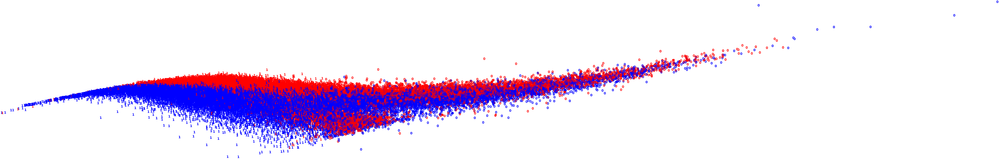

Silhouette score for two cluster k-means: 0.54399292065172


In [ ]:
y_pred = KMeans(n_clusters=2).fit_predict(X_pca)

plt.figure(figsize=(10,5))
colours = 'rbg'
for i in range(X_pca.shape[0]):
    plt.text(X_pca[i, 0], X_pca[i, 1], str(y_pred[i]),
             color=colours[Y[i]],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

print("Silhouette score for two cluster k-means: {}".format(
    metrics.silhouette_score(X_pca, y_pred, metric='euclidean')))

#**Target Variable Gender using DBSCAN w/ tSNE**

Visually this model does tell a great story, which shows that whether male or female, running times do have some overlap, but also at certain points there is a major differentiation between gender.

Unfortunately I  was not able to measure the Silhoette score for this model.

No handles with labels found to put in legend.


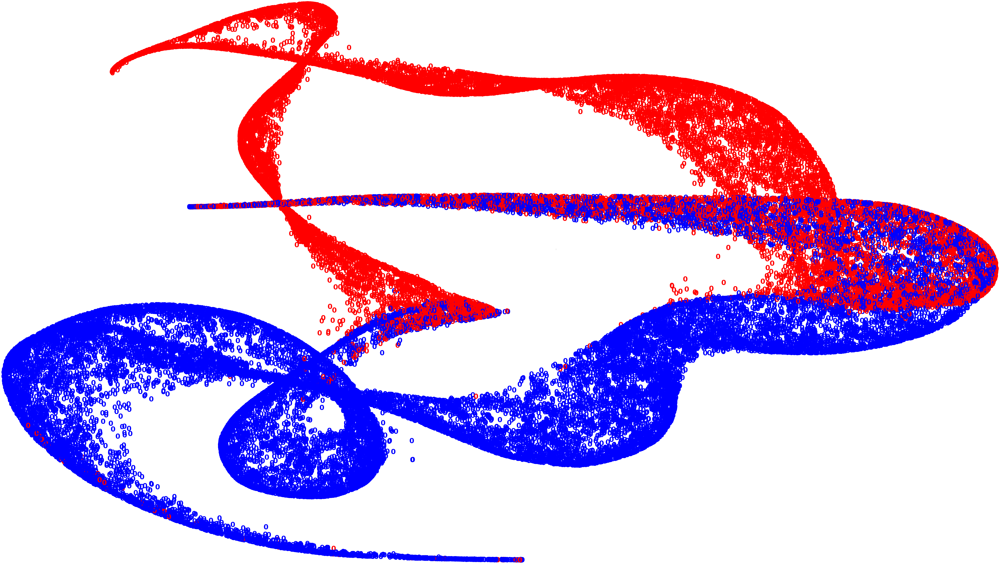

In [ ]:
dbscan_cluster = DBSCAN(eps=.5, min_samples=30)
y_pred = dbscan_cluster.fit_predict(X_tsne)

plt.figure(figsize=(10,5))
colours = 'rbg'
for i in range(X_tsne.shape[0]):
    plt.text(X_tsne[i, 0], X_tsne[i, 1], str(y_pred[i]),
             color=colours[Y[i]],
             fontdict={'weight': 'bold', 'size': 50}
        )
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

In [ ]:
#print("Silhouette score for two cluster k-means: {}".format(
#    metrics.silhouette_score(X_tsne, y_pred ,metric='euclidean')))

#**Target Variable AgeGroup using Kmeans w/ PCA**

The results show a Silhoette score of 52.6%. This indicates a moderate chance the data points are close to their nearest centroid. This model performed well, but not compared to the original with all the years.

Visually the model looks interesting but it does not really help us much. Looking at the visuals alone you would think all age groups overlap. Another interesting thing to note is how different the data looks compared to the model with more years, but less features.



In [ ]:
y_pred = KMeans(n_clusters=2).fit_predict(X_pca)

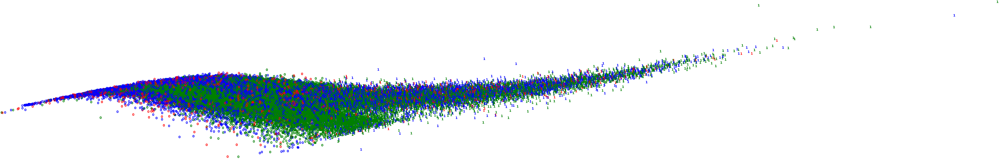

Silhouette score for two cluster k-means: 0.5261316402743621


In [ ]:

plt.figure(figsize=(10,5))
colours = 'rbg'
for i in range(X_pca.shape[0]):
    plt.text(X_pca[i, 0], X_pca[i, 1], str(y_pred[i]),
             color=colours[Y[i]],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

print("Silhouette score for two cluster k-means: {}".format(
    metrics.silhouette_score(X_pca, y_pred, metric='euclidean')))

#**Target Variable AgeGroup using DBSCAN w/ PCA**

Visually this model also is not very useful.

Unfortunately I was not able to measure the Silhoette score for this model.


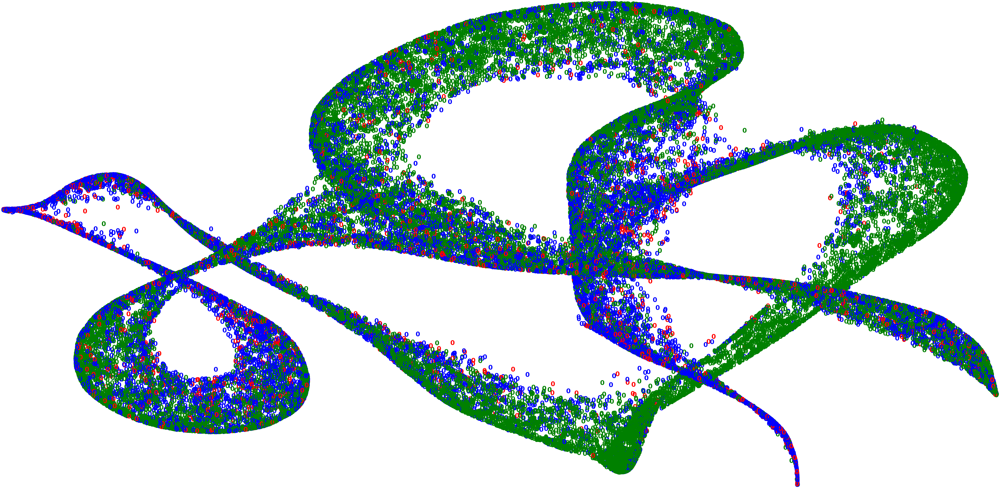

In [ ]:
dbscan_cluster = DBSCAN(eps=.5, min_samples=30)
y_pred = dbscan_cluster.fit_predict(X_tsne)

plt.figure(figsize=(10,5))
colours = 'rbg'
for i in range(X_tsne.shape[0]):
    plt.text(X_tsne[i, 0], X_tsne[i, 1], str(y_pred[i]),
             color=colours[Y[i]],
             fontdict={'weight': 'bold', 'size': 50}
        )
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

#**Summary**

Clearly the best model here is with the DBSCAN clustering technique, with dimensionality reduction of PCA and t-SNE, when trying to determine the gender of the runner. For the question on determining the Age Group of the runner, your best bet would be to use the DBSCAN model again, also with dimensionality reduction of PCA and t-SNE. 

Although Kmeans did perform well given the parameters I tested, the DBSCAN method simply performed bettered. The major caveat being runtime, which DBSCAN's model with use ot t-SNE, even after performing PCA, still can take a very long time.

The questions surrounding the years 2013-2014, although with limited testing, od lend some surpirsing results. Using the same hyperparameters as the best performing models above, the results for both AgeGroup and Gender actually pefromed a little worse, granted not terrible.

This is likely only a starting point, and more testing will be needed, and also serves an excellent lesson that even if wer are using some of the same dataset, by changing the features, we can buile an identical model leading to vastly different results.